In [1]:
import pylab as plt
%pylab inline

Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


In [2]:
import katdal
import katpoint
import scape
import logging
logger = logging.getLogger()
#logger.setLevel(logging.ERROR)

/usr/local/lib/python2.7/dist-packages/pkg_resources/__init__.py:187: RuntimeWarning: You have iterated over the result of pkg_resources.parse_version. This is a legacy behavior which is inconsistent with the new version class introduced in setuptools 8.0. In most cases, conversion to a tuple is unnecessary. For comparison of versions, sort the Version instances directly. If you have another use case requiring the tuple, please file a bug with the setuptools project describing that need.
  stacklevel=1,


In [3]:
#n='/var/kat/archive/data/RTS/telescope_products/2016/01/29/1454054353.h5'
n='/var/kat/archive/data/RTS/telescope_products/2016/01/29/1454033553.h5'
#n = '/var/kat/archive/data/RTS/telescope_products/2015/12/19/1450486821.h5'
#n = '/var/kat/archive/data/RTS/telescope_products/2015/12/03/1449138207.h5'
#n = '/var/kat/archive/data/RTS/telescope_products/2015/11/26/1448574519.h5'
#n = '/var/kat/archive/data/RTS/telescope_products/2015/11/26/1448581975.h5'
#n = '/var/kat/archive/data/RTS/telescope_products/2015/11/27/1448589427.h5'
#n = '/var/kat/archive/data/RTS/telescope_products/2015/11/27/1448597061.h5'
#n = '/var/kat/archive/data/RTS/telescope_products/2015/12/03/1449137265.h5'
#n= '/var/kat/archive/data/RTS/telescope_products/2015/12/03/1449140896.h5'

In [4]:
h5 = katdal.open(n,centre_freq=12500.5e6)
print h5

Name: /var/kat/archive/data/RTS/telescope_products/2016/01/29/1454033553.h5 (version 3.1)
Observer: RTS  Experiment ID: 20160128-0011
Description: 'RTS: 3.4 Interferometric_Pointing M024 Scanning'
Observed from 2016-01-29 04:12:35.021 SAST to 2016-01-29 09:55:26.319 SAST
Dump rate / period: 1.00042 Hz / 1.000 s
Subarrays: 1
  ID  Antennas                            Inputs  Corrprods
   0  m024,m025                            4       12
Spectral Windows: 1
  ID  Product    CentreFreq(MHz)  Bandwidth(MHz)  Channels  ChannelWidth(kHz)
   0              12500.500         856.000          4096      208.984
-------------------------------------------------------------------------------
Data selected according to the following criteria:
  subarray=0
  ants=['m025', 'm024']
  spw=0
-------------------------------------------------------------------------------
Shape: (20580 dumps, 4096 channels, 12 correlation products) => Size: 8.092 GB
Antennas: m024,*m025  Inputs: 4  Autocorr: yes  Crosscor

In [5]:
N = len(h5.compscan_indices)
print N

45


In [6]:
h5.select(scans='~slew',channels=slice(1024,1024+2048),corrprods = 'cross')
print h5.compscan_indices

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]
BusyX

 BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

/usr/local/lib/python2.7/dist-packages/scape/fitting.py:1871: RuntimeWarning: invalid value encountered in sqrt
  std_params = np.sqrt(np.diag(self._interp.cov_params))


BusyX 

BusyX 

BusyX 

BusyX 

/usr/lib/pymodules/python2.7/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX 

BusyX


/usr/lib/pymodules/python2.7/matplotlib/collections.py:548: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == 'face':


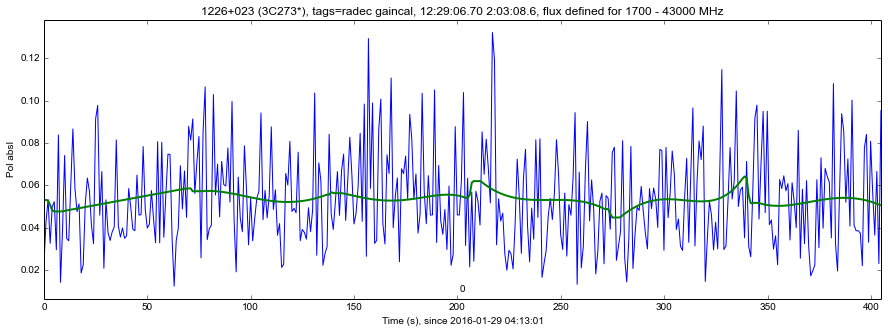

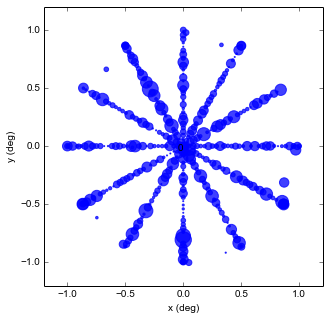

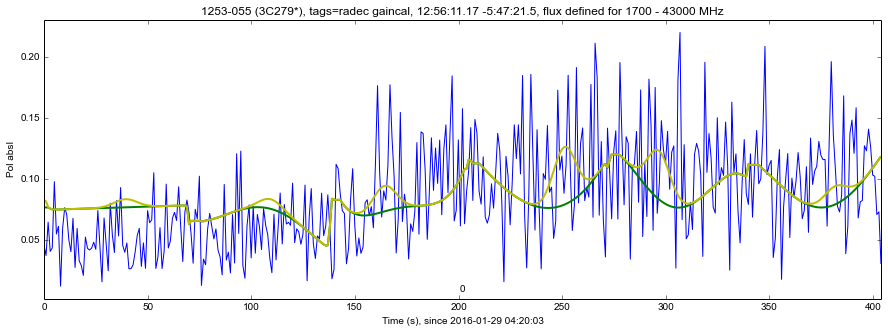

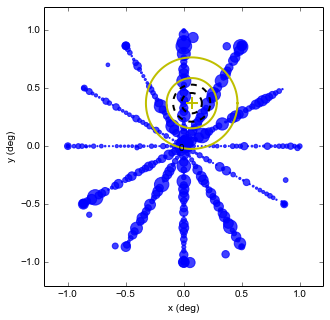

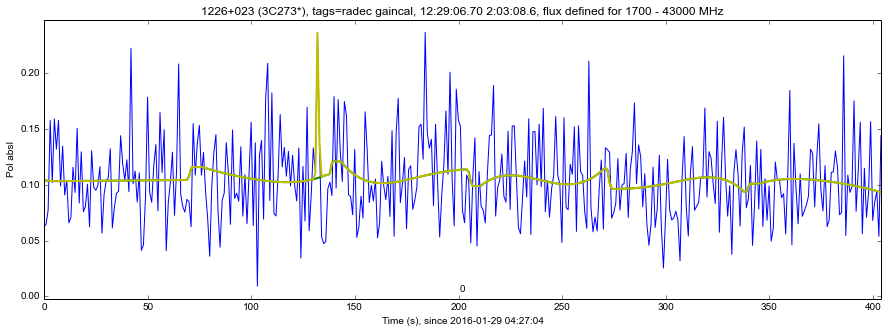

...

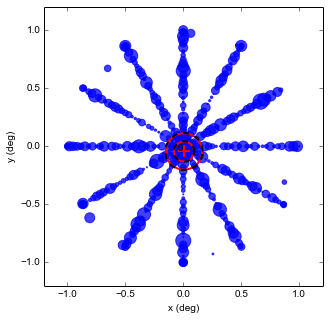

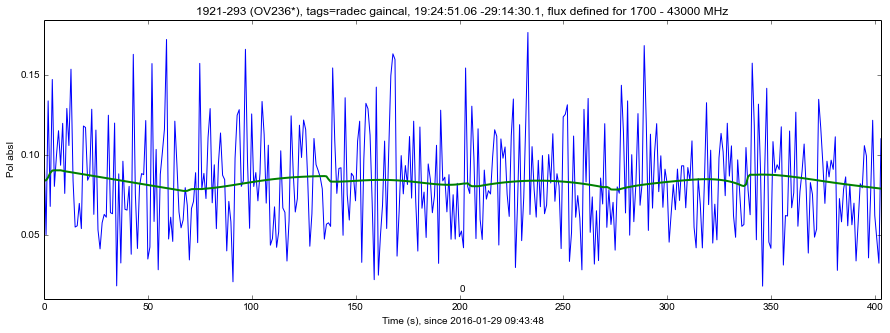

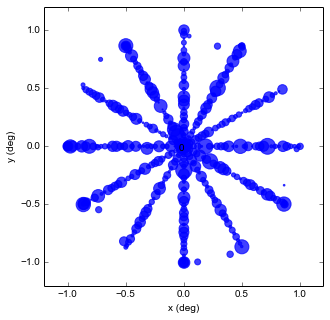

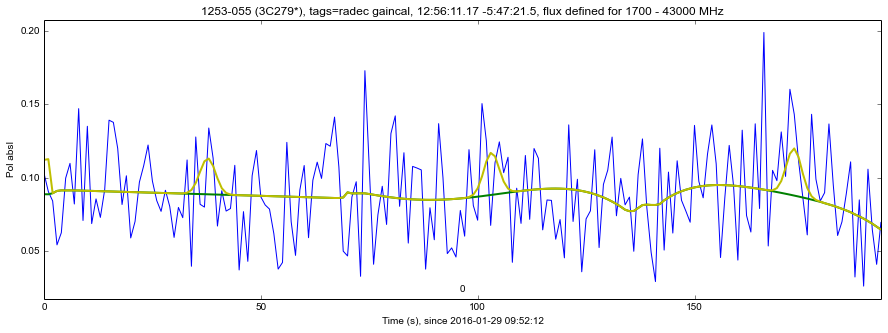

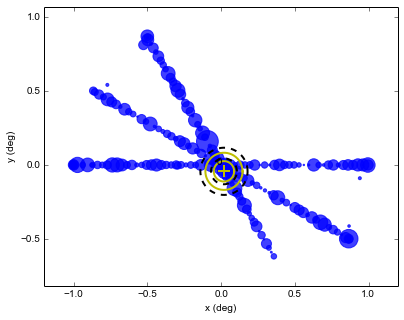

In [7]:

h5.select()
ants = h5.ants
N = len(h5.compscan_indices)
h5.select(scans='track,scan',channels=slice(1024,1024+2048),corrprods = 'cross')
print h5.compscan_indices
for c in h5.compscans():
    d = scape.DataSet(h5,baseline = 'm024,m025')
    #for i in range(len(d.scans)):
    #    d.scans[i].data = scape.stats.remove_spikes(d.scans[i].data,axis=1,spike_width=3,outlier_sigma=5.)    
    d.average()
    print "BusyX",
    d.fit_beams_and_baselines()
    plt.figure(figsize=(15,5))
    scape.plot_compound_scan_in_time(d.compscans[0])
    #pl_title = str(d.compscans[0].target) + '. Compscan %d in %d'%(c[0],N)  '. Beamfit valid: %s'%str(d.compscans[0].beam.is_valid) 
    pl_title = str(d.compscans[0].target)
    plt.title(pl_title) 
    plt.figure(figsize=(15,5))
    scape.plot_compound_scan_on_target(d.compscans[0])
    #print pl_title, d.compscans[0].beam.center

In [8]:
#print d.compscans[0].beam_centre

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]
Busy24


1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz

 [  7.98541020e-05  -4.91763111e-05]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz

 [  1.61190644e-05  -4.18016662e-05]
Busy24


1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz

 [  7.76638975e-05  -4.38315196e-05]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz

 [  6.32982701e-05  -5.82714600e-05]
Busy24


1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz

 [  3.09603983e-05  -6.27902789e-05]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz

 [  4.88778191e-05  -6.49960409e-05]
Busy24


1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz

 [  7.40645536e-05  -7.85172188e-05]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz

 [  5.70611942e-05  -8.39652573e-05]
Busy24


1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz

 [  5.54270891e-05  -6.72403227e-05]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz

 [  4.88633371e-05  -5.81616520e-05]
Busy24


1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz

 [ -6.64505448e-06  -2.15370425e-04]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz

 [  9.55460726e-05  -3.37741078e-05]
Busy24


1921-293 (OV236*), tags=radec gaincal, 19:24:51.06 -29:14:30.1, flux defined for 1700 - 43000 MHz

 [-0.000759    0.00032443]
Busy24


1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz

 [ -2.60239926e-04  -6.90963855e-05]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz

 [ -6.64628404e-05  -1.46157013e-04]
Busy24


1921-293 (OV236*), tags=radec gaincal, 19:24:51.06 -29:14:30.1, flux defined for 1700 - 43000 MHz

 [-0.00038897  0.00020034]
Busy24


1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz

 [ -9.02012976e-05  -1.03993613e-04]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz

 [ -5.98813308e-05  -7.01566610e-05]
Busy24


1921-293 (OV236*), tags=radec gaincal, 19:24:51.06 -29:14:30.1, flux defined for 1700 - 43000 MHz

 [-0.00034239  0.00015182]
Busy24


1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz

 [ -9.30226929e-05  -1.30604097e-04]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz

 [ -6.08872610e-05  -1.35949849e-04]
Busy24


1921-293 (OV236*), tags=radec gaincal, 19:24:51.06 -29:14:30.1, flux defined for 1700 - 43000 MHz

 [-0.00044115  0.00032083]
Busy24


1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz

 [ -1.29434051e-02  -2.96550484e-05]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz

 [ -7.00612814e-05  -1.27454007e-04]
Busy24


1921-293 (OV236*), tags=radec gaincal, 19:24:51.06 -29:14:30.1, flux defined for 1700 - 43000 MHz

 [ -3.06961521e-04   5.58036498e-05]
Busy24


1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz

 [-0.00012206 -0.00010742]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz

 [-0.00011154 -0.00014198]
Busy24


1921-293 (OV236*), tags=radec gaincal, 19:24:51.06 -29:14:30.1, flux defined for 1700 - 43000 MHz

 [-0.00044022  0.00010283]
Busy24


1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz

 [-0.00012188 -0.00012333]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz

 [-0.00013235 -0.00014473]
Busy24


1921-293 (OV236*), tags=radec gaincal, 19:24:51.06 -29:14:30.1, flux defined for 1700 - 43000 MHz

 [ -1.86650401e-04  -5.18976148e-05]
Busy24


1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz

 [ -2.19973694e-04  -9.39638390e-05]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz

 [-0.00015099 -0.00011835]
Busy24


1921-293 (OV236*), tags=radec gaincal, 19:24:51.06 -29:14:30.1, flux defined for 1700 - 43000 MHz

 [ -1.20128517e-04  -9.66992738e-05]
Busy24


1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz

 [ -2.23148834e-04  -6.04235244e-05]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz

 [-0.00024477 -0.00011635]
Busy24


1921-293 (OV236*), tags=radec gaincal, 19:24:51.06 -29:14:30.1, flux defined for 1700 - 43000 MHz

 [-0.00010309 -0.00013079]
Busy24


1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz

 [ -2.08854675e-04  -7.16722630e-05]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz

 [-0.00021884 -0.00011766]
Busy24


1921-293 (OV236*), tags=radec gaincal, 19:24:51.06 -29:14:30.1, flux defined for 1700 - 43000 MHz

 [ -6.95899716e-05  -1.02894114e-04]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz

 [ -2.34304979e-04  -9.39976264e-05]
Busy24


1921-293 (OV236*), tags=radec gaincal, 19:24:51.06 -29:14:30.1, flux defined for 1700 - 43000 MHz

 [ -2.34832306e-05  -1.10135497e-04]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz

 [ -1.88688871e-04  -6.69293742e-05]
Busy24


1921-293 (OV236*), tags=radec gaincal, 19:24:51.06 -29:14:30.1, flux defined for 1700 - 43000 MHz

 [ -2.62761994e-05  -9.57014343e-05]
Busy24


1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz [  2.34264043e-04  -5.22349868e-05]


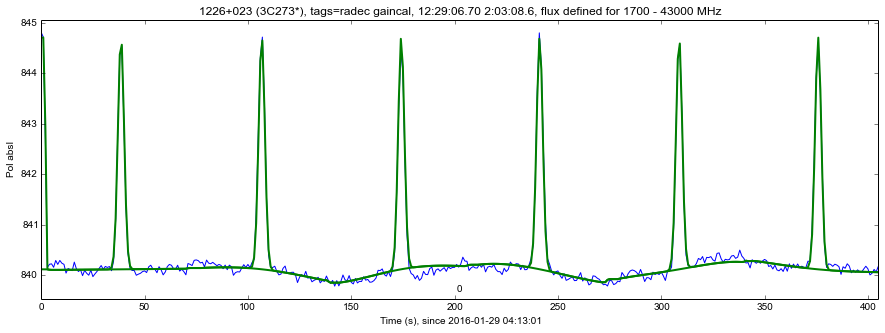

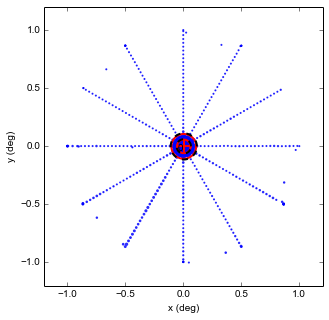

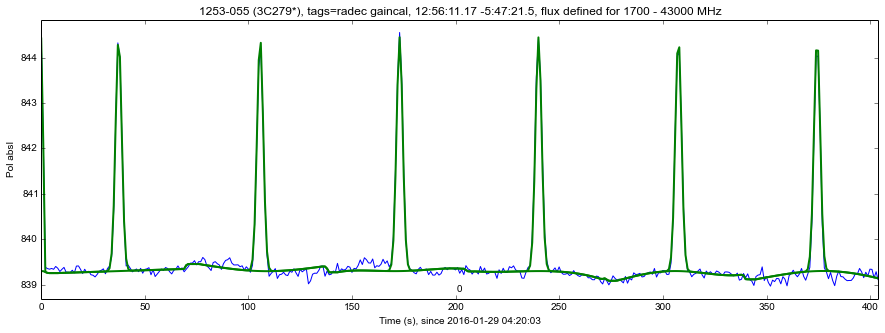

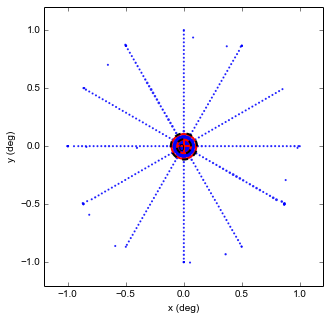

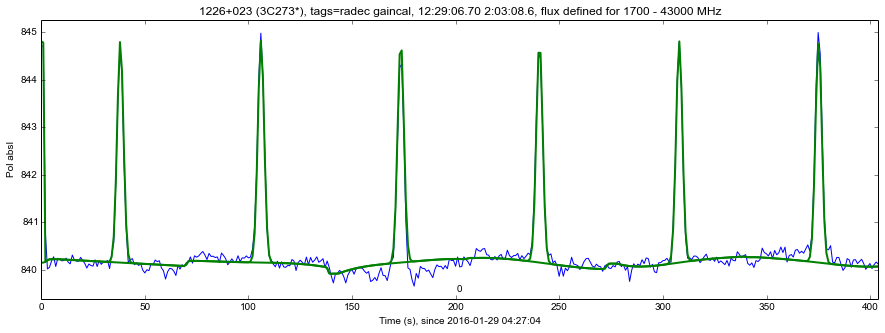

...

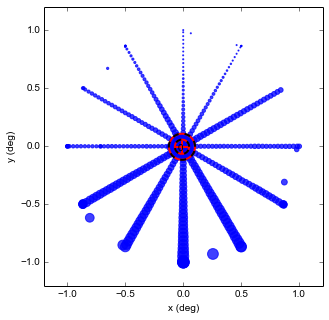

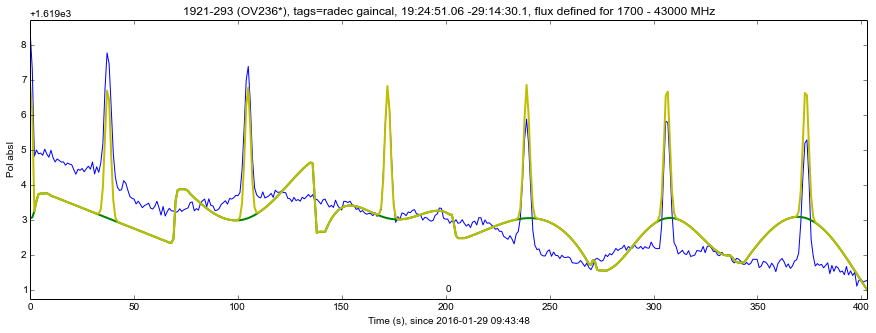

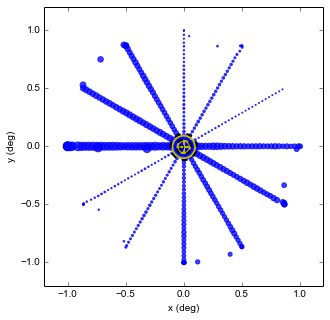

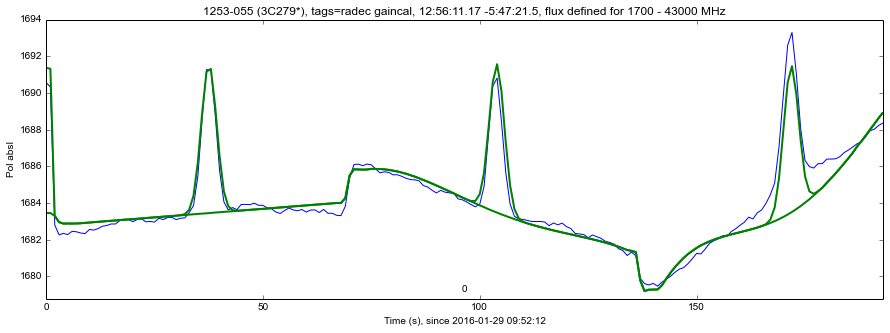

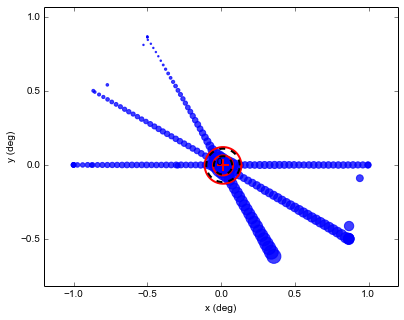

In [9]:

h5.select()
ants = h5.ants
N = len(h5.compscan_indices)
h5.select(scans='track,scan',channels=slice(1024,1024+2048),ants='m024')
print h5.compscan_indices
for c in h5.compscans():
    d = scape.DataSet(h5)
    #for i in range(len(d.scans)):
    #    d.scans[i].data = scape.stats.remove_spikes(d.scans[i].data,axis=1,spike_width=3,outlier_sigma=5.)    
    d.average()
    print "Busy24"
    d.fit_beams_and_baselines()
    figure(figsize=(15,5))
    scape.plot_compound_scan_in_time(d.compscans[0])
    #pl_title = str(d.compscans[0].target) + '. Compscan %d in %d'%(c[0],N) + '. Beamfit valid: %s'%str(d.compscans[0].beam.is_valid) 
    pl_title = str(d.compscans[0].target)
    title(pl_title)
    figure(figsize=(15,5))
    scape.plot_compound_scan_on_target(d.compscans[0])
    print pl_title, d.compscans[0].beam.center